In [1]:
import os
import torchaudio
import torch
import matplotlib.pyplot as plt
import random
from IPython.display import Audio, display


# ======== CONFIG ========
DATASET_ROOT = "data/val"
NUM_SAMPLES_PER_CLASS = 3
MIN_DURATION_SEC = 0.5
# =========================

In [13]:
def is_silent(waveform, threshold=1e-4):
    return waveform.abs().max().item() < threshold

def inspect_audio_file(filepath):
    try:
        waveform, sr = torchaudio.load(filepath)
        duration = waveform.shape[1] / sr

        if is_silent(waveform):
            print(f"AUDIO SILENZIOSO: {os.path.basename(filepath)}")
        if duration < MIN_DURATION_SEC:
            print(f"AUDIO TROPPO CORTO ({duration:.2f}s): {os.path.basename(filepath)}")

        print(f" - File: {os.path.basename(filepath)} | Durata: {duration:.2f}s | SR: {sr}")

        plt.figure(figsize=(10, 2))
        plt.plot(waveform.t().numpy())
        plt.title(os.path.basename(filepath))
        plt.show()

        display(Audio(waveform.numpy(), rate=sr))

    except Exception as e:
        print(f"Errore caricando {filepath}: {e}")


In [14]:
def inspect_dataset(root_dir=DATASET_ROOT, num_samples=NUM_SAMPLES_PER_CLASS):
    for label in sorted(os.listdir(root_dir)):
        label_path = os.path.join(root_dir, label, "audio")
        if not os.path.isdir(label_path):
            continue
        print(f"\nClasse: {label}")
        files = [f for f in os.listdir(label_path) if f.endswith(".wav")]
        if not files:
            print("Nessun file trovato.")
            continue
        sampled = random.sample(files, min(num_samples, len(files)))
        for f in sampled:
            filepath = os.path.join(label_path, f)
            inspect_audio_file(filepath)

In [15]:
def plot_class_distribution(root_dir=DATASET_ROOT):
    label_counts = {}
    for label in sorted(os.listdir(root_dir)):
        label_path = os.path.join(root_dir, label, "audio")
        if not os.path.isdir(label_path):
            continue
        files = [f for f in os.listdir(label_path) if f.endswith(".wav")]
        label_counts[label] = len(files)

    plt.bar(label_counts.keys(), label_counts.values())
    plt.xticks(rotation=45)
    plt.title("Distribuzione delle classi")
    plt.xlabel("Classi")
    plt.ylabel("Numero di file audio")
    plt.tight_layout()
    plt.show()

Ispezione del dataset audio...


Classe: chitarra
 - File: segment_99.wav | Durata: 10.82s | SR: 44100


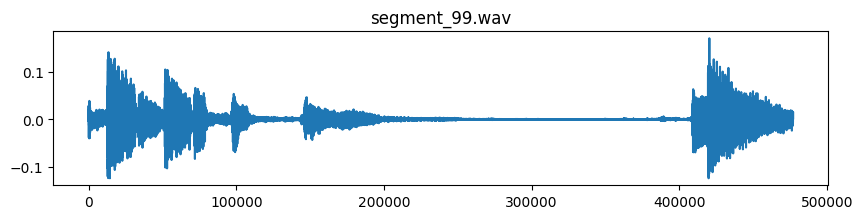

 - File: segment_42.wav | Durata: 10.82s | SR: 44100


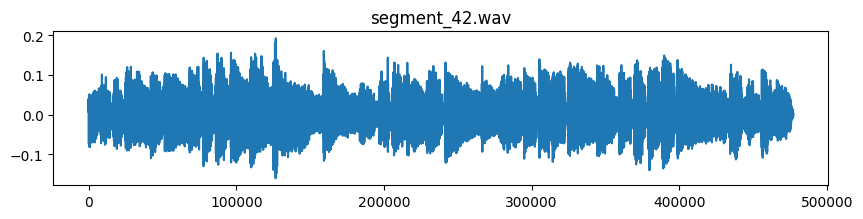

 - File: segment_102.wav | Durata: 10.82s | SR: 44100


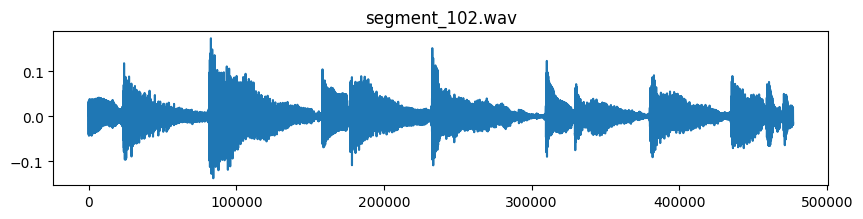


Classe: flauto
 - File: segment_67.wav | Durata: 10.74s | SR: 44100


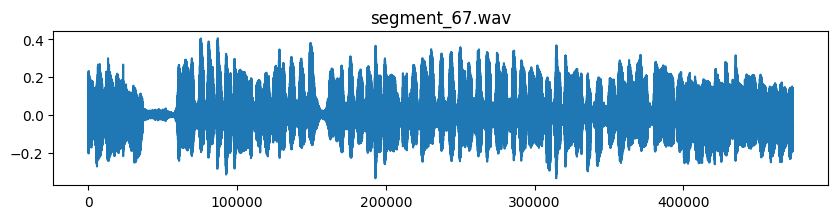

 - File: segment_119.wav | Durata: 10.74s | SR: 44100


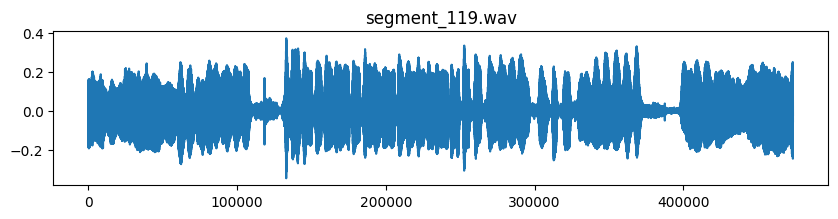

 - File: segment_70.wav | Durata: 10.74s | SR: 44100


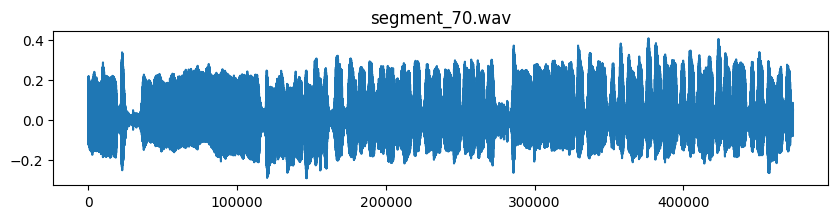


Classe: pianoforte
 - File: segment_60.wav | Durata: 12.17s | SR: 44100


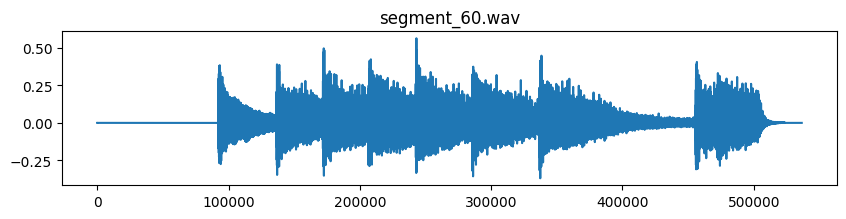

 - File: segment_127.wav | Durata: 12.17s | SR: 44100


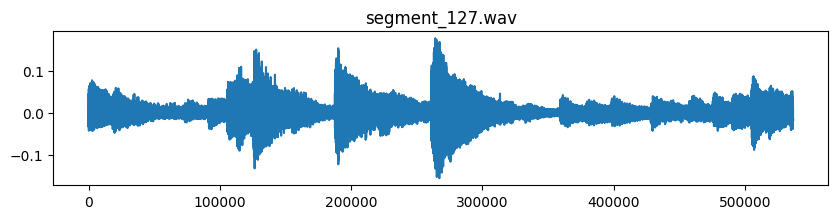

 - File: segment_125.wav | Durata: 12.17s | SR: 44100


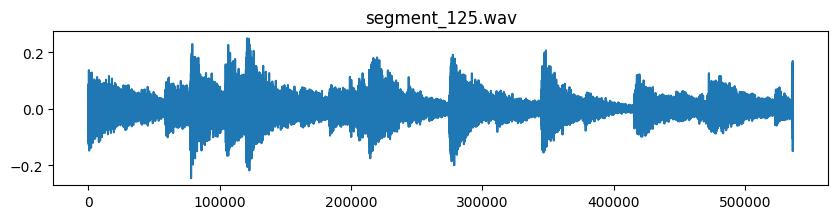


Classe: viola
 - File: vla34.wav | Durata: 10.32s | SR: 44100


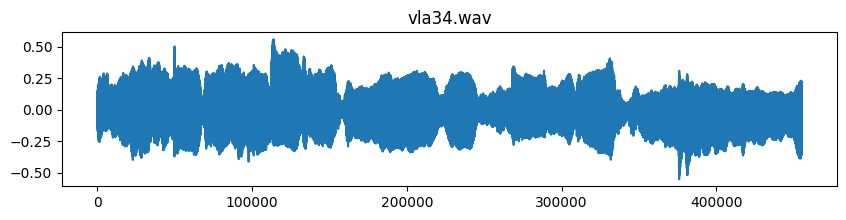

 - File: vla64.wav | Durata: 11.04s | SR: 44100


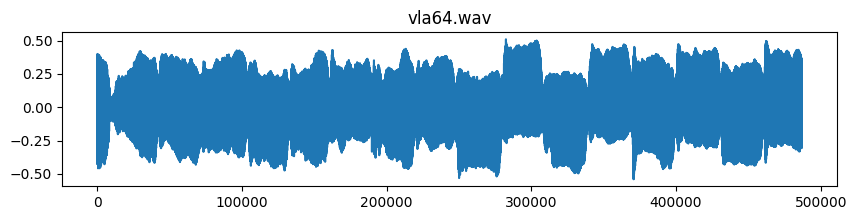

 - File: vla7.wav | Durata: 10.08s | SR: 44100


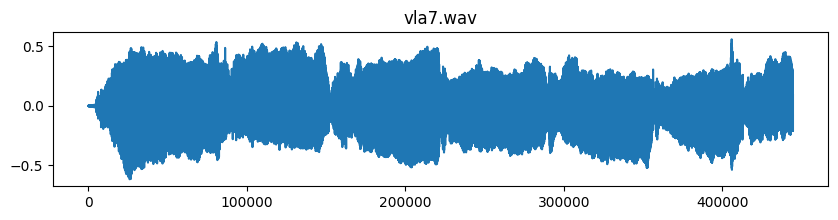


Classe: violino
 - File: segment_109.wav | Durata: 10.64s | SR: 44100


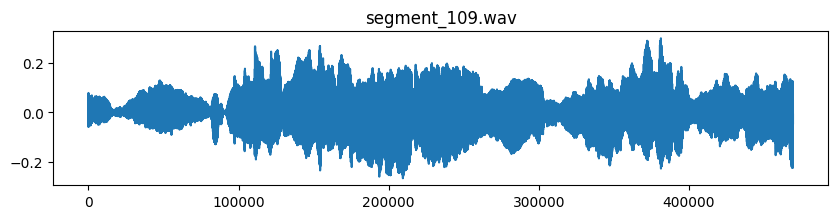

 - File: segment_97.wav | Durata: 10.64s | SR: 44100


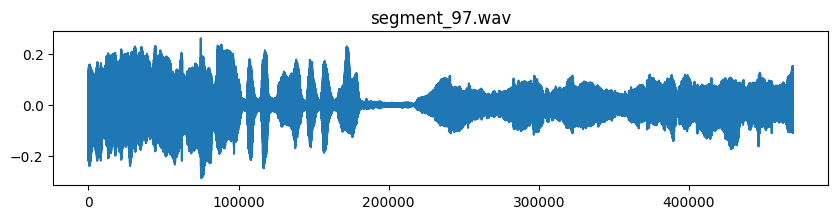

 - File: segment_74.wav | Durata: 10.64s | SR: 44100


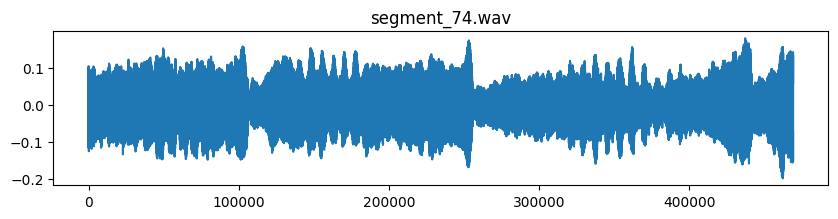


Analisi della distribuzione delle classi:


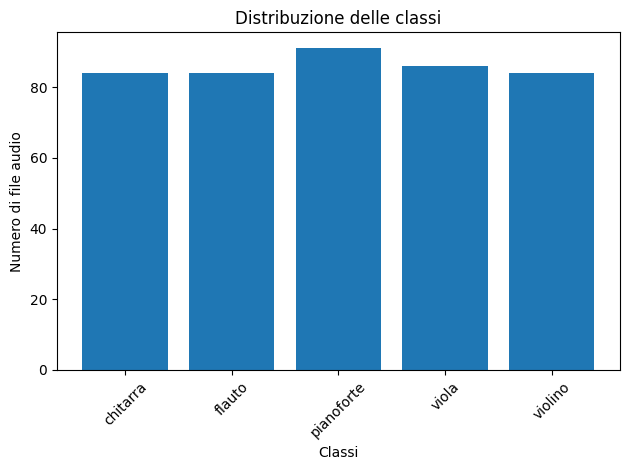

In [32]:
if __name__ == "__main__":
    print("Ispezione del dataset audio...\n")
    inspect_dataset()
    print("\nAnalisi della distribuzione delle classi:")
    plot_class_distribution()

In [3]:
import os
import torchaudio
import torch
from torchaudio.transforms import Resample

# ===== CONFIG =====
INPUT_DIR = "./data/test/viola/audio"
OUTPUT_DIR = "./data/test/viola/audio"
SAMPLE_RATE = 16000
RESAMPLE = False
# ===================

def ensure_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

def convert_file_to_mono(input_path, output_path):
    try:
        waveform, sr = torchaudio.load(input_path)

        # Converti in mono se necessario
        if waveform.shape[0] > 1:
            waveform = torch.mean(waveform, dim=0, keepdim=True)

        # Resample se richiesto
        if RESAMPLE and sr != SAMPLE_RATE:
            resampler = Resample(orig_freq=sr, new_freq=SAMPLE_RATE)
            waveform = resampler(waveform)
            sr = SAMPLE_RATE

        # Crea cartella di output se non esiste
        ensure_dir(os.path.dirname(output_path))

        # Salva il file
        torchaudio.save(output_path, waveform, sr)
        print(f"Salvato: {output_path}")
    except Exception as e:
        print(f"Errore su {input_path}: {e}")

def process_dataset(input_dir=INPUT_DIR, output_dir=OUTPUT_DIR):
    for root, _, files in os.walk(input_dir):
        for file in files:
            if file.endswith(".wav"):
                input_path = os.path.join(root, file)

                # Percorso di output corrispondente
                rel_path = os.path.relpath(input_path, input_dir)
                output_path = os.path.join(output_dir, rel_path)

                convert_file_to_mono(input_path, output_path)

if __name__ == "__main__":
    print("Conversione dei file stereo in mono...")
    process_dataset()
    print("Conversione completata.")


Conversione dei file stereo in mono...
Salvato: ./data/test/viola/audio/vla99.wav
Salvato: ./data/test/viola/audio/vla67.wav
Salvato: ./data/test/viola/audio/vla59.wav
Salvato: ./data/test/viola/audio/vla65.wav
Salvato: ./data/test/viola/audio/vla5.wav
Salvato: ./data/test/viola/audio/vla58.wav
Salvato: ./data/test/viola/audio/vla74.wav
Salvato: ./data/test/viola/audio/vla2.wav
Salvato: ./data/test/viola/audio/vla11.wav
Salvato: ./data/test/viola/audio/vla21.wav
Salvato: ./data/test/viola/audio/vla90.wav
Salvato: ./data/test/viola/audio/vla91.wav
Salvato: ./data/test/viola/audio/vla51.wav
Salvato: ./data/test/viola/audio/vla41.wav
Salvato: ./data/test/viola/audio/vla69.wav
Salvato: ./data/test/viola/audio/vla114.wav
Salvato: ./data/test/viola/audio/vla94.wav
Salvato: ./data/test/viola/audio/vla57.wav
Conversione completata.
